

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

This is the  colab Notebook where i have trained the model with respect to the dataset using detectron2. Here, we will go through some steps including the following:
*  Register a dataset in COCO's json annotation format for
    instance detection, instance segmentation and keypoint detection.
* Train a detectron2 model on a This  dataset.



# Install detectron2

In [ ]:
!pip install pyyaml==5.1
# This is the current pytorch version on Colab. Uncomment this if Colab changes its pytorch version
# !pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html

# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 12.9 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=4f3c9cd04332f2785ea8d3ec610253baa18fe43c19f9c90ad7394ccabd39dd90
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
     |████████████████████████████████| 6.4 MB 784 kB/s 
     |████████████████████████████████| 74 kB 2.6 MB/s 
     |████████████████████████████████| 49 kB 6.7 MB/s 
     |████████████████████████████████| 144 kB 28.2 MB/s 
     |████████████████████████████████| 130 kB 51.8 MB/s 
     |████████████████████████████████| 743 kB 40.5 MB/s 
     |████████████████████████████████| 722 kB 31.2 MB/s 
     |█

In [ ]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version

1.9.0+cu102 True


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/coco_2021_test.zip #unzip the coco_2021_test.zip


Archive:  /content/drive/MyDrive/coco_2021_test.zip
   creating: coco_2021_test/
   creating: coco_2021_test/val/
  inflating: coco_2021_test/val/U10_0_22.png  
  inflating: coco_2021_test/val/U10_1_20.png  
  inflating: coco_2021_test/val/U12_0_15.png  
  inflating: coco_2021_test/val/U12_1_10.png  
  inflating: coco_2021_test/val/U1_14_17.png  
  inflating: coco_2021_test/val/U1_14_9.png  
  inflating: coco_2021_test/val/U1_16_14.png  
  inflating: coco_2021_test/val/U1_16_25.png  
  inflating: coco_2021_test/val/U1_17_11.png  
  inflating: coco_2021_test/val/U2_11_12.png  
  inflating: coco_2021_test/val/U2_11_16.png  
  inflating: coco_2021_test/val/U2_12_19.png  
  inflating: coco_2021_test/val/U2_12_33.png  
  inflating: coco_2021_test/val/U2_13_20.png  
  inflating: coco_2021_test/val/U2_14_14.png  
  inflating: coco_2021_test/val/U2_17_18.png  
  inflating: coco_2021_test/val/U2_17_7.png  
  inflating: coco_2021_test/val/U2_1_25.png  
  inflating: coco_2021_test/val/U2_2_24.png

In [ ]:
!unzip /content/drive/MyDrive/coco_2021_train.zip #unzip coco_2021_train.zip

Archive:  /content/drive/MyDrive/coco_2021_train.zip
   creating: coco_2021_train/
   creating: coco_2021_train/train/
  inflating: coco_2021_train/train/U10_0_10.png  
  inflating: coco_2021_train/train/U10_0_11.png  
  inflating: coco_2021_train/train/U10_0_13.png  
  inflating: coco_2021_train/train/U10_0_16.png  
  inflating: coco_2021_train/train/U10_0_17.png  
  inflating: coco_2021_train/train/U10_0_19.png  
  inflating: coco_2021_train/train/U10_0_20.png  
  inflating: coco_2021_train/train/U10_0_23.png  
  inflating: coco_2021_train/train/U10_1_19.png  
  inflating: coco_2021_train/train/U10_2_12.png  
  inflating: coco_2021_train/train/U10_2_13.png  
  inflating: coco_2021_train/train/U10_2_19.png  
  inflating: coco_2021_train/train/U10_2_8.png  
  inflating: coco_2021_train/train/U10_3_18.png  
  inflating: coco_2021_train/train/U10_3_21.png  
  inflating: coco_2021_train/train/U11_0_11.png  
  inflating: coco_2021_train/train/U11_0_22.png  
  inflating: coco_2021_train/tra

In [ ]:
#Register a dataset in COCO's json annotation format for
    #instance detection.
from detectron2.data.datasets import register_coco_instances
register_coco_instances("Bat_Ball_TrainData", {}, "/content/coco_2021_train/train_annot_new1.json", "/content/coco_2021_train/train")
register_coco_instances("Bat_Ball_TestData", {}, "/content/coco_2021_test/val_annot_new1.json", "/content/coco_2021_test/val")

# Run a pre-trained detectron2 model

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

I have used 'Bat_Ball_train6data','Bat_Ball_test6data
which only has two class: ball,bat.
We'll train a  model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

Note that COCO dataset does not have the "bat","ball" category. so i have registered new dataset in above code which is coco json file format.


## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the dataset. 


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("Bat_Ball_TrainData",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1600  # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 8  # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[08/15 08:11:36 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:17, 9.84MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_pre

[08/15 08:11:55 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


[08/15 08:12:14 d2.utils.events]:  eta: 0:23:00  iter: 19  total_loss: 2.21  loss_cls: 1.091  loss_box_reg: 0.8817  loss_rpn_cls: 0.0794  loss_rpn_loc: 0.05829  time: 0.8790  data_time: 0.0313  lr: 4.9953e-06  max_mem: 1934M
[08/15 08:12:32 d2.utils.events]:  eta: 0:23:08  iter: 39  total_loss: 1.935  loss_cls: 1.026  loss_box_reg: 0.7671  loss_rpn_cls: 0.05715  loss_rpn_loc: 0.04572  time: 0.8926  data_time: 0.0072  lr: 9.9902e-06  max_mem: 1934M
[08/15 08:12:49 d2.utils.events]:  eta: 0:23:09  iter: 59  total_loss: 1.947  loss_cls: 0.9265  loss_box_reg: 0.8142  loss_rpn_cls: 0.085  loss_rpn_loc: 0.05488  time: 0.8917  data_time: 0.0084  lr: 1.4985e-05  max_mem: 1934M
[08/15 08:13:08 d2.utils.events]:  eta: 0:23:11  iter: 79  total_loss: 1.743  loss_cls: 0.8326  loss_box_reg: 0.758  loss_rpn_cls: 0.05323  loss_rpn_loc: 0.04544  time: 0.9009  data_time: 0.0087  lr: 1.998e-05  max_mem: 1934M
[08/15 08:13:27 d2.utils.events]:  eta: 0:22:55  iter: 99  total_loss: 1.747  loss_cls: 0.7242  

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

Testing on videos

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
# import some common libraries
import numpy as np
import tqdm
import cv2
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.data import MetadataCatalog
import time

In [ ]:
# Extract video properties
video = cv2.VideoCapture('2.mp4')
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
frames_per_second = video.get(cv2.CAP_PROP_FPS)
num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

In [ ]:
video_writer = cv2.VideoWriter('out_new2.mp4', fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)


In [ ]:
# Initialize visualizer
v = VideoVisualizer(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), ColorMode.IMAGE)

In [ ]:
def runOnVideo(video, maxFrames):
    """ Runs the predictor on every frame in the video (unless maxFrames is given),
    and returns the frame with the predictions drawn.
    """

    readFrames = 0
    while True:
        hasFrame, frame = video.read()
        if not hasFrame:
            break

        # Get prediction results for this frame
        outputs = predictor(frame)

        # Make sure the frame is colored
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Draw a visualization of the predictions using the video visualizer
        visualization = v.draw_instance_predictions(frame, outputs["instances"].to("cpu"))

        # Convert Matplotlib RGB format to OpenCV BGR format
        visualization = cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)

        yield visualization

        readFrames += 1
        if readFrames > maxFrames:
            break

# Create a cut-off for debugging
num_frames = 120

# Enumerate the frames of the video
for visualization in tqdm.tqdm(runOnVideo(video, num_frames), total=num_frames):

    # Write test image
    cv2.imwrite('POSE detectron2.png', visualization)

    # Write to video file
    video_writer.write(visualization)

# Release resources
video.release()
video_writer.release()
cv2.destroyAllWindows()

 20%|██        | 24/120 [00:09<00:36,  2.66it/s]


Then, we randomly select several samples to visualize the prediction results.

In [ ]:
from detectron2.utils.visualizer import ColorMode


In [ ]:
d = DatasetCatalog.get('Bat_Ball_TestData')
d[0]


[08/14 05:36:53 d2.data.datasets.coco]: Loaded 79 images in COCO format from /content/coco_2021_test/val_annot_new1.json


{'annotations': [{'bbox': [244, 314, 24, 27],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 0,
   'iscrowd': 0},
  {'bbox': [174, 367, 47, 57],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 1,
   'iscrowd': 0}],
 'file_name': '/content/coco_2021_test/val/U10_0_22.png',
 'height': 720,
 'image_id': 0,
 'width': 680}

{'instances': Instances(num_instances=1, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[362.3787, 339.7979, 375.3551, 355.1609]], device='cuda:0')), scores: tensor([0.8620], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


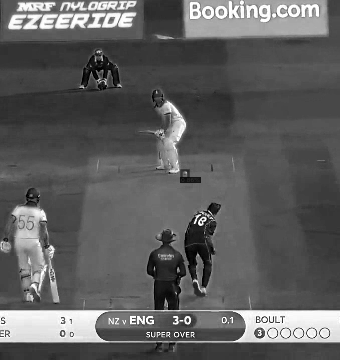

{'instances': Instances(num_instances=2, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[295.2857, 182.3572, 327.8520, 232.4171],
        [261.3871, 308.1230, 273.3603, 321.6289]], device='cuda:0')), scores: tensor([0.9222, 0.8167], device='cuda:0'), pred_classes: tensor([1, 0], device='cuda:0')])}


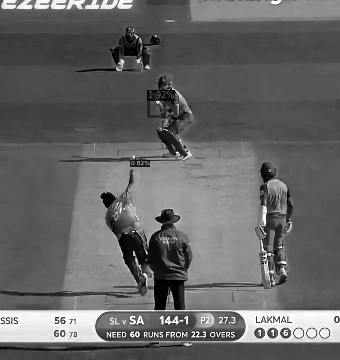

{'instances': Instances(num_instances=3, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[409.0435,  51.3883, 434.5940, 132.8506],
        [468.7673, 242.5880, 487.0217, 261.5352],
        [400.5581,  45.6896, 441.8851, 155.1767]], device='cuda:0')), scores: tensor([0.9228, 0.8974, 0.8147], device='cuda:0'), pred_classes: tensor([1, 0, 1], device='cuda:0')])}


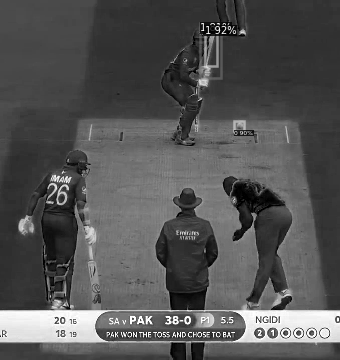

{'instances': Instances(num_instances=1, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[251.6176, 339.6122, 264.0491, 355.6838]], device='cuda:0')), scores: tensor([0.8040], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


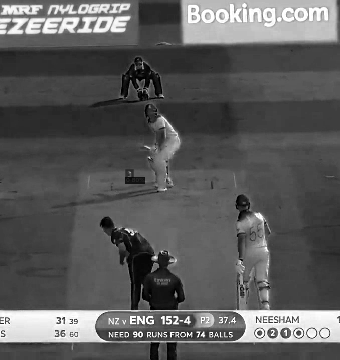

{'instances': Instances(num_instances=2, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[332.5837, 272.1374, 401.1520, 354.6810],
        [501.1714, 324.5754, 531.2340, 341.5805]], device='cuda:0')), scores: tensor([0.8749, 0.7536], device='cuda:0'), pred_classes: tensor([1, 0], device='cuda:0')])}


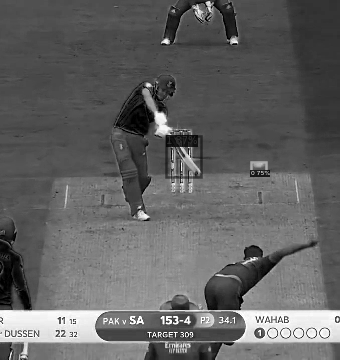

{'instances': Instances(num_instances=1, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[298.5393, 258.9922, 316.6708, 275.9471]], device='cuda:0')), scores: tensor([0.9409], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


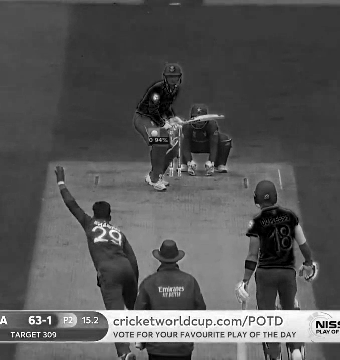

{'instances': Instances(num_instances=2, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[356.4742, 276.1443, 412.0397, 306.6711],
        [381.3423, 409.1457, 394.7084, 423.6329]], device='cuda:0')), scores: tensor([0.9337, 0.8721], device='cuda:0'), pred_classes: tensor([1, 0], device='cuda:0')])}


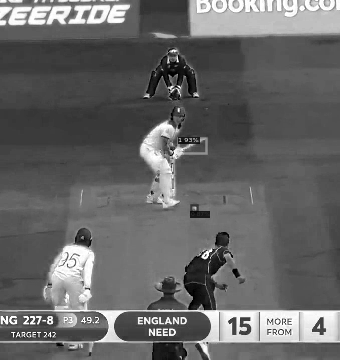

{'instances': Instances(num_instances=2, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[275.8204, 161.0822, 296.9556, 201.1701],
        [276.8187, 160.3184, 303.0399, 224.6590]], device='cuda:0')), scores: tensor([0.8509, 0.7317], device='cuda:0'), pred_classes: tensor([1, 1], device='cuda:0')])}


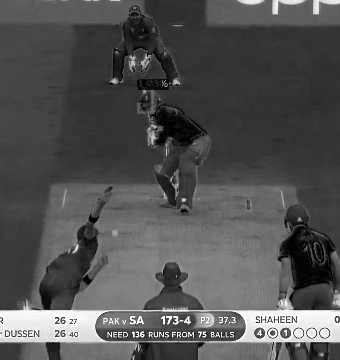

{'instances': Instances(num_instances=3, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[374.0533, 205.3105, 435.2738, 270.5533],
        [445.1027, 342.4607, 462.6078, 357.1910],
        [390.0716, 207.4484, 432.1628, 244.8806]], device='cuda:0')), scores: tensor([0.9596, 0.9203, 0.8295], device='cuda:0'), pred_classes: tensor([1, 0, 1], device='cuda:0')])}


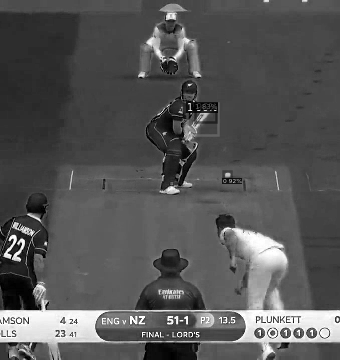

{'instances': Instances(num_instances=3, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[378.1476, 322.5190, 392.4416, 337.2089],
        [351.8412, 226.8995, 392.0335, 245.9387],
        [333.3188, 222.3057, 397.7843, 245.2722]], device='cuda:0')), scores: tensor([0.8823, 0.7909, 0.7577], device='cuda:0'), pred_classes: tensor([0, 1, 1], device='cuda:0')])}


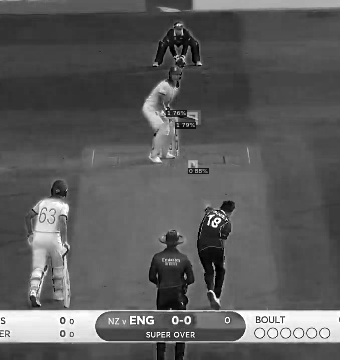

{'instances': Instances(num_instances=3, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[251.1186, 280.3253, 265.9980, 296.2990],
        [258.2139, 100.5772, 278.0981, 142.8430],
        [252.5859, 281.1457, 262.1992, 293.1215]], device='cuda:0')), scores: tensor([0.8772, 0.8099, 0.7098], device='cuda:0'), pred_classes: tensor([0, 1, 0], device='cuda:0')])}


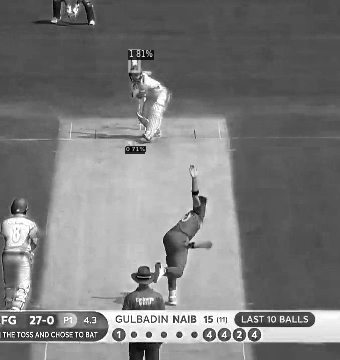

{'instances': Instances(num_instances=1, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[235.8453, 560.5314, 255.2379, 584.1231]], device='cuda:0')), scores: tensor([0.7524], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


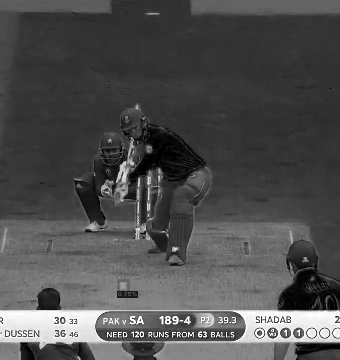

{'instances': Instances(num_instances=1, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[219.2058, 337.1281, 230.8528, 348.3469]], device='cuda:0')), scores: tensor([0.8731], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


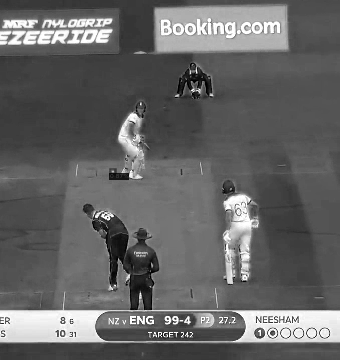

{'instances': Instances(num_instances=4, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[267.9275, 179.9759, 341.2501, 264.2232],
        [379.2386, 450.4272, 394.4673, 465.0927],
        [295.2119, 177.8901, 342.4406, 238.4360],
        [286.7314, 171.4581, 331.1499, 289.1469]], device='cuda:0')), scores: tensor([0.9185, 0.8219, 0.8176, 0.7691], device='cuda:0'), pred_classes: tensor([1, 0, 1, 1], device='cuda:0')])}


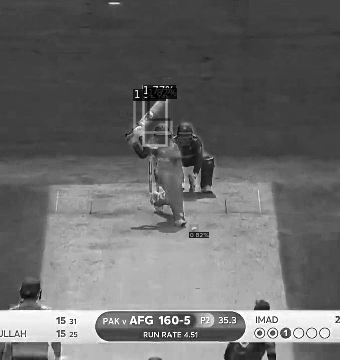

{'instances': Instances(num_instances=3, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[253.6831, 252.1490, 268.9026, 266.9958],
        [325.3369, 210.3218, 401.2293, 235.8976],
        [306.3786, 205.2537, 402.6528, 246.1229]], device='cuda:0')), scores: tensor([0.9305, 0.8553, 0.7444], device='cuda:0'), pred_classes: tensor([0, 1, 1], device='cuda:0')])}


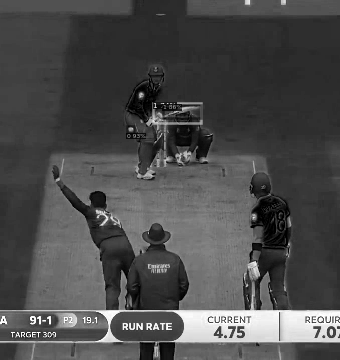

{'instances': Instances(num_instances=2, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[421.7982, 262.8770, 438.2960, 279.6805],
        [278.9592,  90.5922, 300.8111, 123.9616]], device='cuda:0')), scores: tensor([0.9037, 0.7537], device='cuda:0'), pred_classes: tensor([0, 1], device='cuda:0')])}


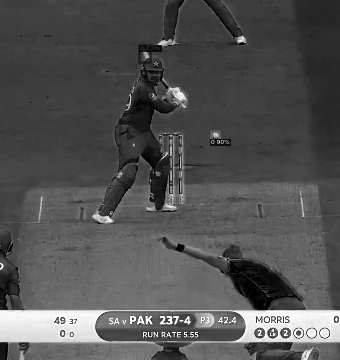

{'instances': Instances(num_instances=2, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[144.6190, 384.8548, 166.1704, 404.3600],
        [147.5283, 388.6828, 164.1402, 398.9482]], device='cuda:0')), scores: tensor([0.8787, 0.7476], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


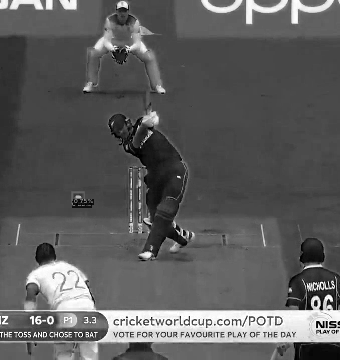

{'instances': Instances(num_instances=3, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[279.5474, 243.4342, 334.6341, 336.0041],
        [369.6526, 299.4142, 395.4488, 318.1977],
        [375.5119, 301.8535, 394.0274, 314.2871]], device='cuda:0')), scores: tensor([0.8868, 0.8294, 0.7071], device='cuda:0'), pred_classes: tensor([1, 0, 0], device='cuda:0')])}


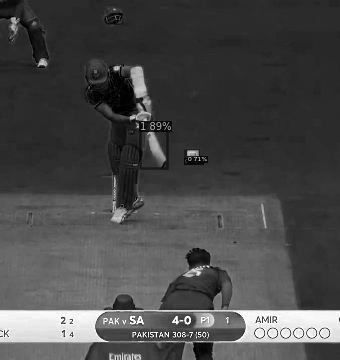

{'instances': Instances(num_instances=2, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[169.5147,  93.7302, 206.2501, 163.4368],
        [256.4467, 255.1857, 269.9083, 268.2242]], device='cuda:0')), scores: tensor([0.8859, 0.7553], device='cuda:0'), pred_classes: tensor([1, 0], device='cuda:0')])}


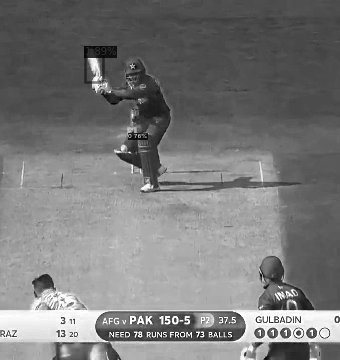

{'instances': Instances(num_instances=5, image_height=720, image_width=680, fields=[pred_boxes: Boxes(tensor([[284.0381,  76.1204, 313.4774, 143.0935],
        [375.6373, 373.1398, 390.7683, 390.9919],
        [275.3659,  83.9204, 324.0627, 155.9562],
        [378.4148, 374.7726, 389.3797, 386.7400],
        [291.5548,  71.9575, 328.0027, 145.0936]], device='cuda:0')), scores: tensor([0.9618, 0.8849, 0.8406, 0.8311, 0.7723], device='cuda:0'), pred_classes: tensor([1, 0, 1, 0, 1], device='cuda:0')])}


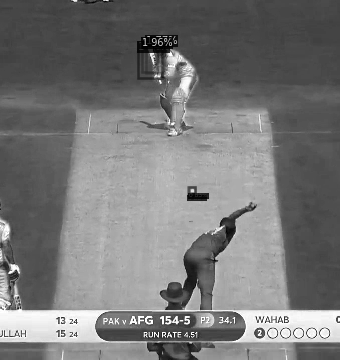

In [ ]:
for i in random.sample(d,20):
  im=cv2.imread(i['file_name'])
  outputs=predictor(im)
  print(outputs)
  v=v = Visualizer(im[:, :, ::-1],scale=0.5)
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-3])